In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import surprise
import ast
from surprise import Dataset, Reader, KNNBasic
from surprise.model_selection import train_test_split
from surprise import accuracy
from sklearn.metrics import precision_score, recall_score, f1_score
import plotly.express as px
import plotly.graph_objects as go
import networkx as nx
from surprise.model_selection import cross_validate
import random
from surprise import NormalPredictor, BaselineOnly, KNNBasic, KNNWithZScore, KNNBaseline, SVD, SVDpp, NMF, SlopeOne, CoClustering

In [6]:
checkins = pd.read_csv('gowalla/gowalla_checkins.csv')

In [7]:
checkins.count()

userid      36001959
placeid     36001959
datetime    36001959
dtype: int64

#### Checking unique number of users

In [8]:
checkins['userid'].nunique()

319063

#### Removing users with low activity

In [9]:
user_unique_place_count = checkins.groupby('userid')['placeid'].nunique().reset_index()
user_unique_place_count.columns = ['userid', 'unique_place_count']

In [10]:
user_unique_place_count.head()

,userid,unique_place_count
0,1,756
1,2,1220
2,3,905
3,4,613
4,5,1124


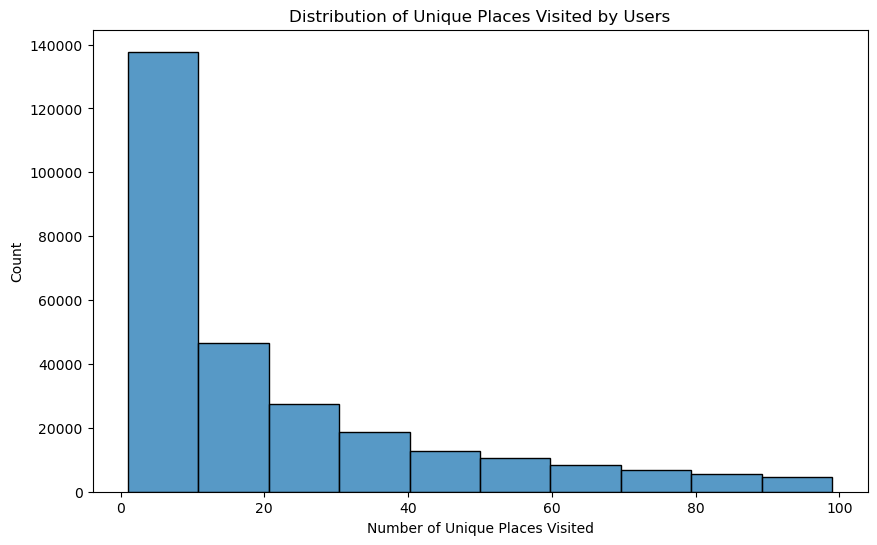

In [11]:

# Plot the distribution
plt.figure(figsize=(10, 6))
sns.histplot(user_unique_place_count[user_unique_place_count['unique_place_count'] < 100]['unique_place_count'], bins=10)
plt.title('Distribution of Unique Places Visited by Users')
plt.xlabel('Number of Unique Places Visited')
plt.ylabel('Count')
plt.show()

We can see that most of the users fall in the less than 10 uniquer checkins bucket, since these users might reduce the accuracy of our recommendations and to improve overall computational efficiency, we will filter out these users with low activity

In [12]:
active_users = user_unique_place_count[user_unique_place_count['unique_place_count'] > 10]['userid']

# Filter the original checkins dataset
filtered_checkins = checkins[checkins['userid'].isin(active_users)]

#### We have filtered the dataset to 181k unique users after removing users with low activity

In [13]:
filtered_checkins['userid'].nunique()

181286

In [14]:
filtered_checkins['placeid'].nunique()

2789742

In [15]:
spots = pd.read_csv('gowalla/gowalla_spots_subset1.csv')
spots2 = pd.read_csv('gowalla/gowalla_spots_subset2.csv', encoding='ISO-8859-1')

In [16]:
spots2 = spots2.iloc[:, :5]

In [19]:
spots['id'].nunique()

2724891

In [20]:
spots2['id'].nunique()

120958

#### Since spots2 only has 120k unique records out of 2.7M, we will not use this data since most of the data is not available/missing

#### Merging checkins dataset with the filtered spots dataset - only following columns - 'photos_count', 'checkins_count', 'radius_meters'

In [21]:
spots = spots.rename(columns={'id': 'placeid'})
checkins_merged = checkins.merge(spots[['placeid', 'lng', 'lat', 'photos_count', 'checkins_count', 'radius_meters']], on='placeid', how='inner')

In [22]:
checkins_merged.shape

(35676281, 8)

In [23]:
checkins_merged.head()

,userid,placeid,datetime,lng,lat,photos_count,checkins_count,radius_meters
0,1338,482954,2011-06-23T02:24:22Z,-93.177506,44.934198,4,50,50
1,116691,482954,2011-06-05T17:42:29Z,-93.177506,44.934198,4,50,50
2,59161,482954,2011-01-14T01:39:11Z,-93.177506,44.934198,4,50,50
3,59161,482954,2010-07-23T01:32:22Z,-93.177506,44.934198,4,50,50
4,149777,482954,2010-03-18T01:40:40Z,-93.177506,44.934198,4,50,50


In [24]:
userinfo = pd.read_csv('gowalla/gowalla_userinfo.csv')

In [25]:
userinfo.shape

(407533, 16)

In [26]:
userinfo.head()

,id,bookmarked_spots_count,challenge_pin_count,country_pin_count,highlights_count,items_count,photos_count,pins_count,province_pin_count,region_pin_count,state_pin_count,trips_count,friends_count,stamps_count,checkin_num,places_num
0,1,26,59,1,29,18,135,85,0,13,12,2,372,757,1766,756
1,2,36,79,12,117,29,1069,138,0,31,19,7,775,1227,2892,1220
2,3,11,70,1,42,49,149,93,0,7,6,2,100,905,3021,905
3,4,7,51,1,13,29,138,80,0,13,12,1,179,608,1325,613
4,5,34,82,5,62,36,1012,134,0,19,14,2,525,1124,3215,1124


#### merge the userinfo also into the dataset - we will only consider the foloowing columns pins_count, trips_count,friends_count, checkin_num 

In [27]:
userinfo = userinfo.rename(columns={'id': 'userid'})
checkins_merged = checkins_merged.merge(userinfo[['userid', 'pins_count', 'friends_count', 'checkin_num', 'trips_count']], on='userid', how='inner')

In [28]:
checkins_merged.head()

,userid,placeid,datetime,lng,lat,photos_count,checkins_count,radius_meters,pins_count,friends_count,checkin_num,trips_count
0,1338,482954,2011-06-23T02:24:22Z,-93.177506,44.934198,4,50,50,31,27,272,0
1,1338,580963,2011-06-22T14:23:03Z,-93.366249,45.204928,0,6,75,31,27,272,0
2,1338,365256,2011-06-09T23:29:30Z,-93.277574,44.981997,169,1407,250,31,27,272,0
3,1338,365256,2011-04-24T17:13:13Z,-93.277574,44.981997,169,1407,250,31,27,272,0
4,1338,365256,2010-10-07T21:08:35Z,-93.277574,44.981997,169,1407,250,31,27,272,0


#### Limit POI's to areas in NY, USA only

In [29]:
# Define geographical boundaries for the USA
lng_min, lat_min, lng_max, lat_max = -74.2589, 40.4774, -73.7004, 40.9176

# Filter checkins data to include only locations within the USA boundaries
checkins_merged_ny = checkins_merged[(checkins_merged['lat'] >= lat_min) & (checkins_merged['lat'] <= lat_max) &
                        (checkins_merged['lng'] >= lng_min) & (checkins_merged['lng'] <= lng_max)]

#### Visualize checkins on a geographic map

In [30]:
usa_map = folium.Map(location=[40.5, -74], zoom_start=10)

# Convert the checkin locations to a list of tuples
checkin_locations = list(zip(checkins_merged_ny['lat'], checkins_merged_ny['lng']))

# Create a HeatMap layer with the checkin locations
HeatMap(checkin_locations).add_to(usa_map)

# Save the map as an HTML file
usa_map.save('checkin_heatmap.html')

usa_map

In [31]:
checkins_merged_ny.shape

(626939, 12)

In [32]:
checkins_merged_ny.to_csv('input_df.csv', index=False)

In [12]:
checkins_merged_ny = pd.read_csv('input_df.csv')

In [13]:
ny_venues = pd.read_csv("gowalla/spots.txt", sep='\t')


In [14]:
ny_venues

,spotid,spotname,geo-coordinates
0,1391604,Conference House Park,POINT(-74.2523431778 40.5017589436)
1,1391611,Almer G. Russell Pavilion,POINT(-74.2542636395 40.5022647413)
2,3612422,Conference House,POINT(-74.2490418254 40.5000644614)
3,3612431,Billop House,POINT(-74.2490418254 40.5000644614)
4,1391499,Biddle House,POINT(-74.2541456223 40.5054829933)
...,...,...,...
30361,873008,CVS,POINT(-73.8583821667 40.9052244667)
30362,397723,Larchmont Club,POINT(-73.745129 40.9244924667)
30363,1224978,Zitoune,POINT(-73.75237983 40.94017511)
30364,1272266,Stop & Shop,POINT(-73.7475444 40.93326389)


#### Joining dataset with NY venues dataset that has spotnames for each place id

In [15]:
ny_venues = ny_venues.rename(columns={'spotid': 'placeid'})
checkins_merged_ny = checkins_merged_ny.merge(ny_venues[['placeid', 'spotname']], on='placeid', how='inner')

In [16]:
checkins_merged_ny

,userid,placeid,datetime,lng,lat,photos_count,checkins_count,radius_meters,pins_count,friends_count,checkin_num,trips_count,spotname
0,116691,11835,2011-04-08T19:00:31Z,-73.982180,40.753231,91,1302,150,86,48,5281,0,The New York Public Library
1,43632,11835,2011-04-09T02:29:46Z,-73.982180,40.753231,91,1302,150,44,1,3644,0,The New York Public Library
2,112025,11835,2011-04-28T07:02:50Z,-73.982180,40.753231,91,1302,150,261,1709,5679,12,The New York Public Library
3,1531870,11835,2011-04-28T05:44:40Z,-73.982180,40.753231,91,1302,150,255,1393,13384,4,The New York Public Library
4,533055,11835,2011-04-08T19:00:28Z,-73.982180,40.753231,91,1302,150,66,10,6963,0,The New York Public Library
...,...,...,...,...,...,...,...,...,...,...,...,...,...
526805,2399201,7075222,2011-03-22T00:14:13Z,-73.923626,40.772655,0,10,50,4,1,11,0,Mi Casa
526806,2399201,7075222,2011-03-21T06:02:31Z,-73.923626,40.772655,0,10,50,4,1,11,0,Mi Casa
526807,2399201,7075222,2011-03-20T03:44:25Z,-73.923626,40.772655,0,10,50,4,1,11,0,Mi Casa
526808,2399201,7075222,2011-03-15T06:22:47Z,-73.923626,40.772655,0,10,50,4,1,11,0,Mi Casa


In [19]:
checkins_merged_ny.shape

(526810, 13)

In [20]:
checkins_merged_ny['placeid'].nunique()

26823

In [21]:
checkins_merged_ny['userid'].nunique()

19099

In [24]:
checkins_merged_ny.columns = ['userid', 'placeid', 'datetime', 'lng', 'lat', 'place_photos_count', 'place_checkins_count', 'place_radius_meters', 'user_pins_count', 'user_friends_count', 'user_checkin_num','user_trips_count', 'place_name']

In [25]:
checkins_merged_ny.head()

,userid,placeid,datetime,lng,lat,place_photos_count,place_checkins_count,place_radius_meters,user_pins_count,user_friends_count,user_checkin_num,user_trips_count,place_name
0,116691,11835,2011-04-08T19:00:31Z,-73.98218,40.753231,91,1302,150,86,48,5281,0,The New York Public Library
1,43632,11835,2011-04-09T02:29:46Z,-73.98218,40.753231,91,1302,150,44,1,3644,0,The New York Public Library
2,112025,11835,2011-04-28T07:02:50Z,-73.98218,40.753231,91,1302,150,261,1709,5679,12,The New York Public Library
3,1531870,11835,2011-04-28T05:44:40Z,-73.98218,40.753231,91,1302,150,255,1393,13384,4,The New York Public Library
4,533055,11835,2011-04-08T19:00:28Z,-73.98218,40.753231,91,1302,150,66,10,6963,0,The New York Public Library


In [26]:
checkins_merged_ny.to_csv("Final_Input_data.csv", index = False)

## START FROM HERE 

##### We have done the following data preprocessing steps for recommendation -
1)filtered out users with checkins < 10 or checkins >100 for computational efficiency and also for the following reasons - a) filtering out users with low number of users prevents sparse matrics and b) users with too many checkins might dominate the reommendations and lead to a bias in the result <br>
2) focused on places specific to the area of New York (based on lat. long. boundaries)

In [3]:
data = pd.read_csv("Final_Data_ratings 1.csv")

#### 142k rows in our dataset

In [153]:
data.shape

(142439, 13)

In [121]:
data

,userid,placeid,lng,lat,place_photos_count,place_checkins_count,place_radius_meters,user_pins_count,user_friends_count,user_checkin_num,user_trips_count,place_name,ratings
0,1,11742,-74.011363,40.707417,45,493,75,85,372,1766,2,New York Stock Exchange,0.000000
1,1,11834,-73.983618,40.753816,157,1475,250,85,372,1766,2,Bryant Park,0.000000
2,1,11844,-73.986225,40.756880,593,7689,300,85,372,1766,2,Times Square,2.186351
3,1,12313,-73.985732,40.748444,152,2204,200,85,372,1766,2,Empire State Building,0.000000
4,1,12973,-73.989455,40.741388,62,980,50,85,372,1766,2,Flatiron Building,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
142434,2681172,6740470,-74.119356,40.695534,1,49,150,15,4,22,0,Casciano Memorial Bridge,0.000000
142435,2681172,6754579,-73.924065,40.743519,1,2,75,15,4,22,0,Natural Tofu,0.000000
142436,2681172,6789052,-73.985021,40.763324,3,5,50,15,4,22,0,Grooveshark NY Loft 888,4.173217
142437,2681172,7104534,-73.988149,40.734980,2,14,100,15,4,22,0,Hillsong NYC,0.000000


In [122]:
data_places = data[['placeid', 'lng','lat','place_photos_count', 'place_checkins_count', 'place_radius_meters','place_name']].drop_duplicates()

#### Number of places IN FINAL DATASET (UNIQUE LOCATIONS)

In [123]:
data_places.shape

(20738, 7)

#### Places with Highest Checkin Counts

/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


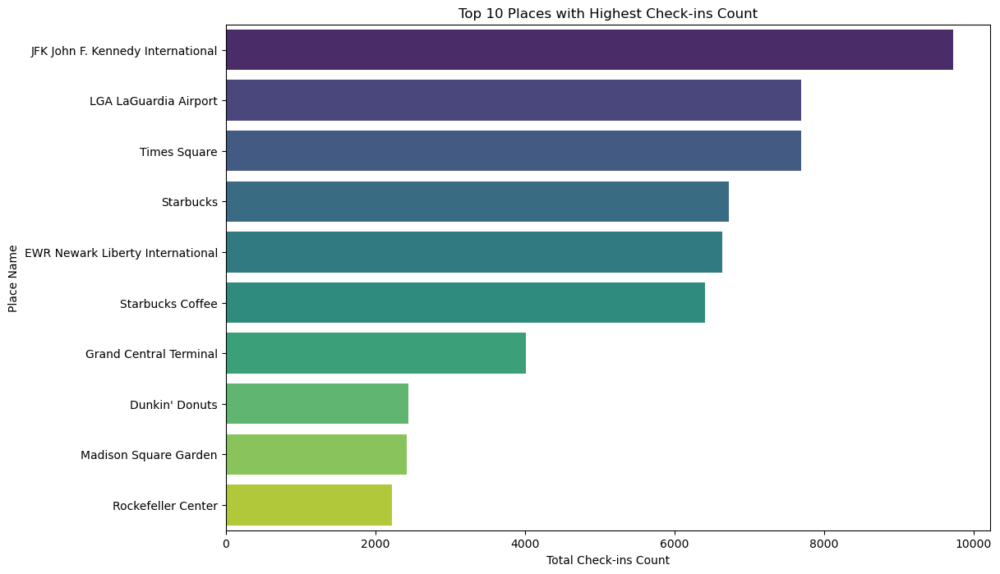

In [124]:
# Group by place_name and sum the check-ins count
place_checkins = data_places.groupby('place_name')['place_checkins_count'].sum().reset_index()

# Sort by check-ins count in descending order
place_checkins = place_checkins.sort_values(by='place_checkins_count', ascending=False)

# Select the top 10 places
top_10_places = place_checkins.head(10)

# Plot a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='place_checkins_count', y='place_name', data=top_10_places, palette='viridis')
plt.title('Top 10 Places with Highest Check-ins Count')
plt.xlabel('Total Check-ins Count')
plt.ylabel('Place Name')
plt.show()

In [126]:
spots = pd.read_csv('gowalla/gowalla_spots_subset1.csv')

In [128]:
spots = spots.rename(columns={'id': 'placeid'})

In [129]:
data_places = data_places.merge(spots[['placeid', 'spot_categories']],on = "placeid", how = 'left')

In [131]:
data_places['spot_categories'] = data_places['spot_categories'].apply(ast.literal_eval)
data_places['category'] = data_places['spot_categories'].apply(lambda x: x[0]['name'] if x and len(x) > 0 else "No Category")

In [133]:
data_places.drop('spot_categories', axis=1, inplace = True)

In [134]:
data_places

,placeid,lng,lat,place_photos_count,place_checkins_count,place_radius_meters,place_name,category
0,11742,-74.011363,40.707417,45,493,75,New York Stock Exchange,Skyscraper
1,11834,-73.983618,40.753816,157,1475,250,Bryant Park,City Park
2,11844,-73.986225,40.756880,593,7689,300,Times Square,Other - Entertainment
3,12313,-73.985732,40.748444,152,2204,200,Empire State Building,Skyscraper
4,12973,-73.989455,40.741388,62,980,50,Flatiron Building,Skyscraper
...,...,...,...,...,...,...,...,...
20733,7504227,-73.816693,40.702280,0,1,75,Broadway Junction Q 24,Bus Station
20734,7544286,-73.839498,40.688123,0,1,75,West Indian Deli,Other - Food
20735,7545048,-73.831065,40.684023,0,1,75,Romeo's Pizza,Italian
20736,155762,-73.984381,40.769856,0,14,75,Special Coffee And Donut,Coffee Shop


#### Location Categories with highest checkin counts

/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


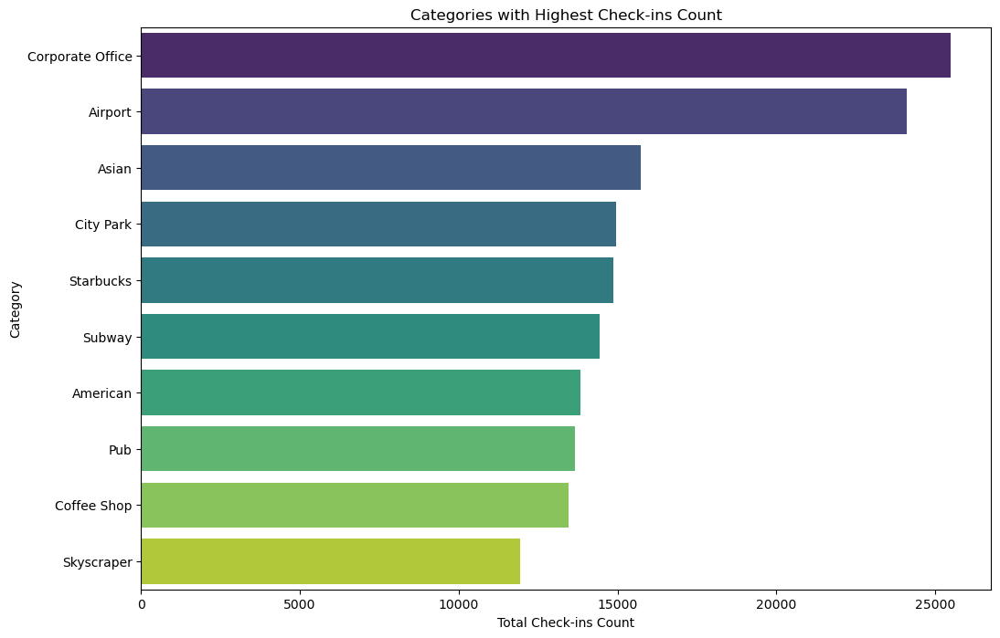

In [135]:
category_checkins = data_places.groupby('category')['place_checkins_count'].sum().reset_index()

# Sort by check-ins count in descending order
category_checkins = category_checkins.sort_values(by='place_checkins_count', ascending=False)[:10]

# Plot a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='place_checkins_count', y='category', data=category_checkins, palette='viridis')
plt.title('Categories with Highest Check-ins Count')
plt.xlabel('Total Check-ins Count')
plt.ylabel('Category')
plt.show()

#### Visualizing checkins on a geographic map - output in html file

In [ ]:
from folium.plugins import HeatMap

m = folium.Map(location=[data_places['lat'].mean(), data_places['lng'].mean()], zoom_start=12)

# Create a MarkerCluster layer
marker_cluster = MarkerCluster().add_to(m)

# Add markers for each location with popup displaying place name and check-in count
for index, row in data_places.iterrows():
    folium.Marker([row['lat'], row['lng']],
                  popup=f"{row['place_name']} - Check-ins: {row['place_checkins_count']}",
                  icon=None).add_to(marker_cluster)

# Save the map as an HTML file or display it in the notebook
m.save('checkin_marker_cluster.html')


In [137]:
data_user = data[['userid', 'user_pins_count', 'user_friends_count', 'user_checkin_num', 'user_trips_count']].drop_duplicates()

#### Total number of unique users

In [138]:
data_user.shape

(5006, 5)

In [139]:
data_user.head()

,userid,user_pins_count,user_friends_count,user_checkin_num,user_trips_count
0,1,85,372,1766,2
39,2,138,775,2892,7
79,3,93,100,3021,2
112,55,42,61,516,0
126,57,76,154,6808,1


#### User features correlation matrix

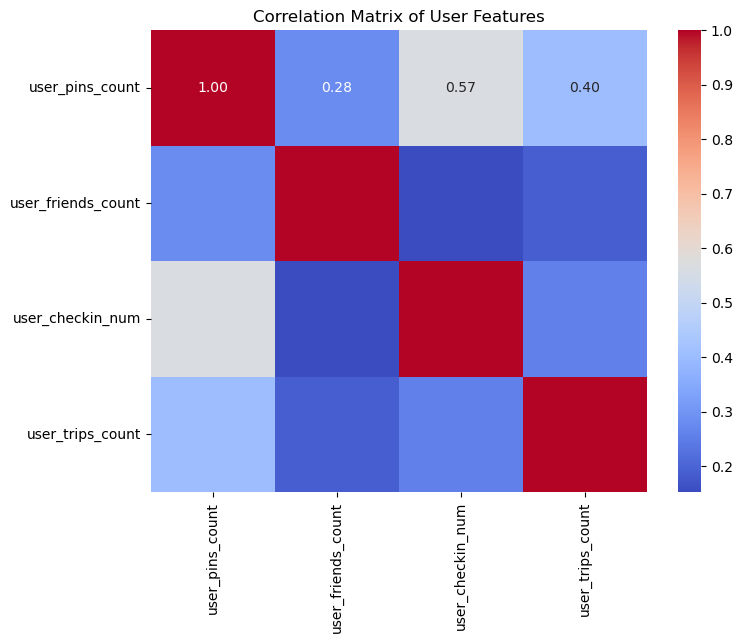

In [140]:
correlation_matrix = data_user.drop('userid',axis=1).corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of User Features')
plt.show()

#### Top 10 most active users based on checkins

/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


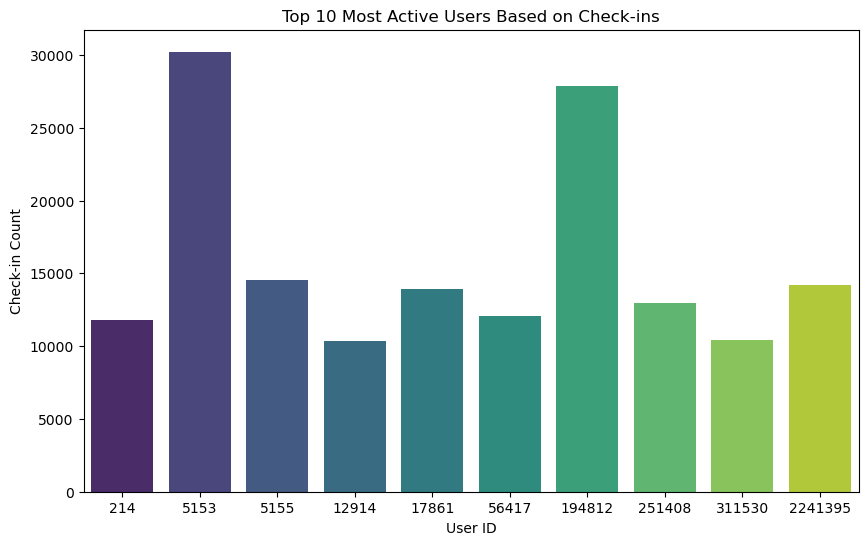

In [141]:
most_active_users = data_user.sort_values(by='user_checkin_num', ascending=False)

# Plot a bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x='userid', y='user_checkin_num', data=most_active_users.head(10), palette='viridis')
plt.title('Top 10 Most Active Users Based on Check-ins')
plt.xlabel('User ID')
plt.ylabel('Check-in Count')
plt.show()

#### Most active users based on trips

/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aravind/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


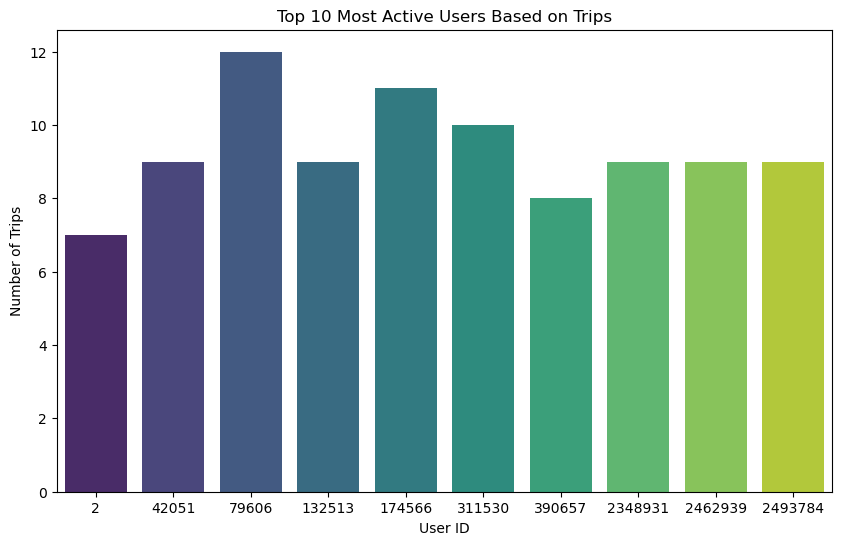

In [142]:
most_active_users = data_user.sort_values(by='user_trips_count', ascending=False)

# Plot a bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x='userid', y='user_trips_count', data=most_active_users.head(10), palette='viridis')
plt.title('Top 10 Most Active Users Based on Trips')
plt.xlabel('User ID')
plt.ylabel('Number of Trips')
plt.show()

### WIP from here onwards

### Recommedations (Naive)

In [38]:
data['ratings'].max(), data['ratings'].min()

(10.0, 1.0)

#### Clip ratings to between 1 to 10 instead

In [409]:
data['ratings'] = data['ratings'].clip(lower=1, upper=10)

#### Training the model 

In [410]:
def train_collaborative_filtering_model(trainset):
#     # Use a basic collaborative filtering model (user-based)
    sim_options = {'name': 'cosine', 'user_based': True}
    model = KNNBasic(sim_options=sim_options)
#     model = SVDpp()
#     model = BaselineOnly()    # Train the model
#     model = SVD()
#     model = NMF()
    model.fit(trainset)
    
    return model

#### Evaluate the model

In [411]:
def evaluate_model(model, testset):
    # Make predictions on the test set
    predictions = model.test(testset)
    
    # Evaluate using Surprise's accuracy metrics
    accuracy_metrics = accuracy.rmse(predictions)
    
    return accuracy_metrics

#### Get Top recommendations

In [412]:
def get_top_n_recommendations(model, user_id, n=5):
    # Get the items the user hasn't rated
    unrated_items = [item for item in data['placeid'].unique() if item not in data[data['userid'] == user_id]['placeid'].unique()]

    # Get predicted ratings for unrated items
    predictions = [model.predict(user_id, item) for item in unrated_items]

    # Sort predictions by estimated rating in descending order
    sorted_predictions = sorted(predictions, key=lambda x: x.est, reverse=True)

    # Get the top N recommended place IDs
    top_recommendations = [prediction.iid for prediction in sorted_predictions[:n]]
    
    return top_recommendations

In [413]:
def mean_reciprocal_rank(ranks):
    return sum(1.0 / rank for rank in ranks) / len(ranks)

In [416]:
reader = Reader(rating_scale=(1, 10))
data_new = Dataset.load_from_df(data[['userid', 'placeid', 'ratings']], reader)

In [417]:
# Split the data into train and test sets
trainset, testset = train_test_split(data_new, test_size=0.2, random_state=42)

# Train collaborative filtering model
cf_model = train_collaborative_filtering_model(trainset)

# Evaluate the model on the test set
evaluate_model(cf_model, testset)
predictions = cf_model.test(testset)

Computing the cosine similarity matrix...
Done computing similarity matrix.
RMSE: 1.4528


In [406]:
user_id_to_recommend = 1
top_recommendations = get_top_n_recommendations(cf_model, user_id_to_recommend, n=5)
print(f"Top recommendations for user {user_id_to_recommend}: {top_recommendations}")

Top recommendations for user 1: [320630, 941249, 179980, 1440842, 84885]


In [407]:
cross_validate(cf_model, data_new, measures=['RMSE', 'MAE'], cv=5, verbose=True)

Evaluating RMSE, MAE of algorithm SVDpp on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.3200  1.3202  1.3135  1.3165  1.3293  1.3199  0.0053  
MAE (testset)     0.6318  0.6368  0.6324  0.6295  0.6417  0.6344  0.0044  
Fit time          2.05    2.08    2.04    2.07    2.25    2.10    0.08    
Test time         0.50    0.51    0.49    0.52    0.52    0.51    0.01    


{'test_rmse': array([1.31995813, 1.32019515, 1.31352458, 1.31652736, 1.32932296]),
 'test_mae': array([0.63178425, 0.63681047, 0.63240129, 0.62949536, 0.64174923]),
 'fit_time': (2.0487849712371826,
  2.0769288539886475,
  2.041127920150757,
  2.0719292163848877,
  2.2509548664093018),
 'test_time': (0.49730396270751953,
  0.5132098197937012,
  0.48853302001953125,
  0.5159487724304199,
  0.521552324295044)}

#### Evaluating Precision and recall @ k 

In [379]:
from collections import defaultdict
def precision_recall_at_k(predictions, k=10, threshold=3.5):
    """Return precision and recall at k metrics for each user"""

    # First map the predictions to each user.
    user_est_true = defaultdict(list)
    for uid, _, true_r, est, _ in predictions:
        user_est_true[uid].append((est, true_r))

    precisions = dict()
    recalls = dict()
    for uid, user_ratings in user_est_true.items():

        # Sort user ratings by estimated value
        user_ratings.sort(key=lambda x: x[0], reverse=True)

        # Number of relevant items
        n_rel = sum((true_r >= threshold) for (_, true_r) in user_ratings)

        # Number of recommended items in top k
        n_rec_k = sum((est >= threshold) for (est, _) in user_ratings[:k])

        # Number of relevant and recommended items in top k
        n_rel_and_rec_k = sum(
            ((true_r >= threshold) and (est >= threshold))
            for (est, true_r) in user_ratings[:k]
        )

        # Precision@K: Proportion of recommended items that are relevant
        # When n_rec_k is 0, Precision is undefined. We here set it to 0.

        precisions[uid] = n_rel_and_rec_k / n_rec_k if n_rec_k != 0 else 0

        # Recall@K: Proportion of relevant items that are recommended
        # When n_rel is 0, Recall is undefined. We here set it to 0.

        recalls[uid] = n_rel_and_rec_k / n_rel if n_rel != 0 else 0

    return precisions, recalls

In [390]:
precisions, recalls = precision_recall_at_k(predictions, k=10, threshold=1.001) 
print("Precision with NMF for 10 folds", sum(prec for prec in precisions.values()) / len(precisions))
print("Recall with NMF for 10 folds", sum(rec for rec in recalls.values()) / len(recalls))
print("F1 score with ")

Precision with NMF for 10 folds 0.14423121270880648
Recall with NMF for 10 folds 0.3490485181553323


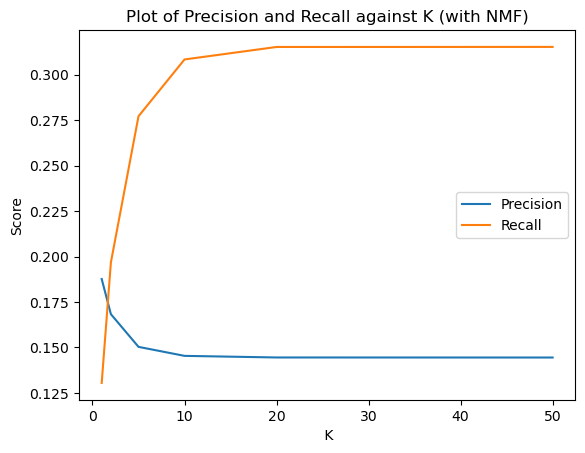

In [339]:
# Define a range of k values
k_values = [1, 2, 5, 10, 20, 50]

# Initialize lists to store precision and recall values
precisions = []
recalls = []

# Calculate precision and recall at different values of k
for k in k_values:
    precisions_k, recalls_k = precision_recall_at_k(predictions, k=k, threshold=1.0001)
    avg_precision_k = sum(prec for prec in precisions_k.values()) / len(precisions_k)
    avg_recall_k = sum(rec for rec in recalls_k.values()) / len(recalls_k)
    precisions.append(avg_precision_k)
    recalls.append(avg_recall_k)

# Plot precision and recall at different values of k
plt.plot(k_values, precisions, label='Precision')
plt.plot(k_values, recalls, label='Recall')
plt.xlabel(' K')
plt.ylabel('Score')
plt.title("Plot of Precision and Recall against K (with NMF)")
plt.legend()
plt.show()

#### Visualizing the recommendations

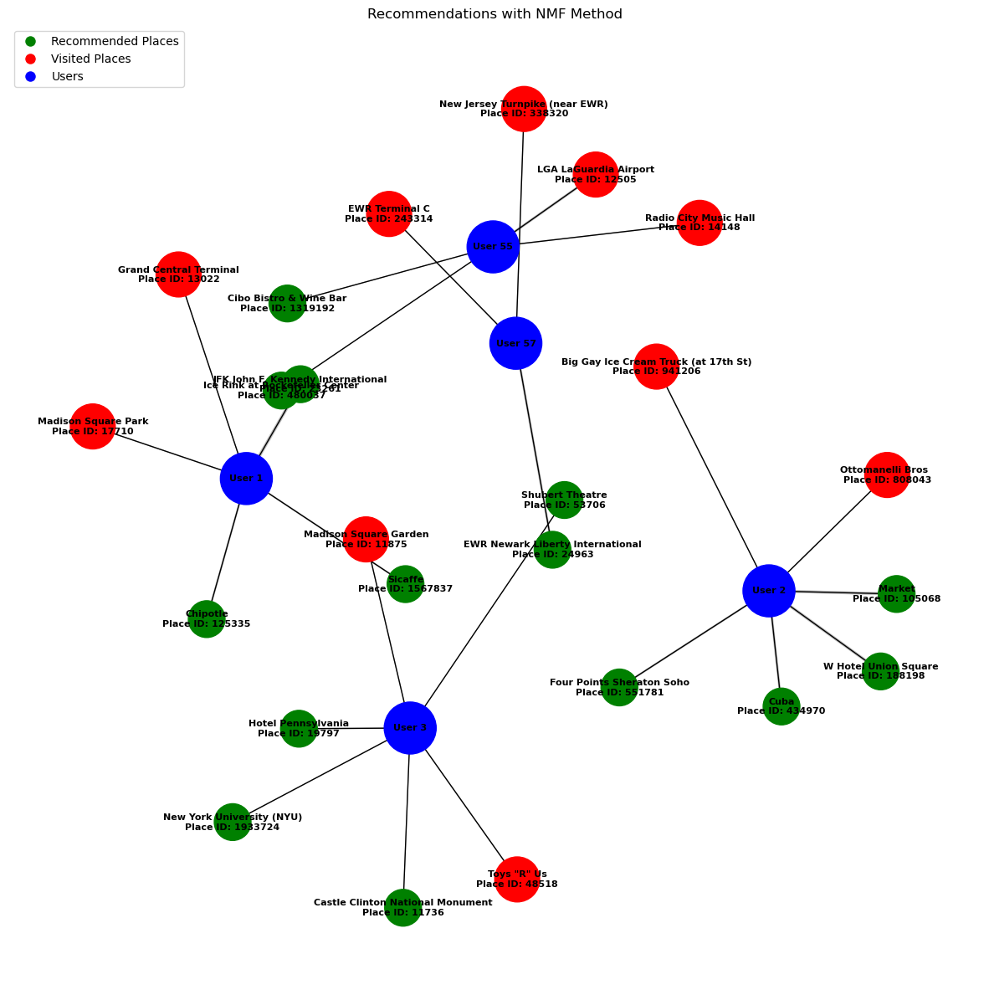

In [341]:
# Filter predictions for 5 users
user_ids_to_visualize = data['userid'].unique()[:5]

# Filter and keep only top 3 predictions for each user
filtered_predictions = {}
for user_id in user_ids_to_visualize:
    user_predictions = [pred for pred in predictions if int(pred.uid) == user_id]
    user_predictions.sort(key=lambda x: x.est, reverse=True)
    filtered_predictions[user_id] = user_predictions[:4]

# Create a graph
G = nx.Graph()

# Add nodes for users and recommended places
for user_id, user_predictions in filtered_predictions.items():
    G.add_node(user_id, label=f'User {user_id}', color='blue', size=20)
    for pred in user_predictions:
        place_id = pred.iid
        place_name = data.loc[data['placeid'] == place_id, 'place_name'].values[0]
        G.add_node(place_id, label=f'{place_name}\nPlace ID: {place_id}', color='green', size=10)
        G.add_edge(user_id, place_id, weight=pred.est)

# Add nodes for places already visited by the same users
visited_places = data[data['userid'].isin(user_ids_to_visualize)].groupby('userid').apply(lambda x: x.sample(n=2)).reset_index(drop=True)
for _, row in visited_places.iterrows():
    user_id = row['userid']
    place_id = row['placeid']
    place_name = row['place_name']
    G.add_node(place_id, label=f'{place_name}\nPlace ID: {place_id}', color='red', size=15)
    G.add_edge(user_id, place_id, weight=row['ratings'])

# Set node colors based on 'color' attribute
node_colors = [G.nodes[node]['color'] for node in G.nodes]

# Set node sizes based on 'size' attribute
node_sizes = [G.nodes[node]['size'] * 100 for node in G.nodes]

# Set node labels based on 'label' attribute
node_labels = {node: G.nodes[node]['label'] for node in G.nodes}

edge_weights = [G.edges[edge]['weight'] for edge in G.edges]

# Create a layout for our nodes (using Kamada-Kawai layout in this example)
pos = nx.spring_layout(G, k=0.6)
plt.figure(figsize = (15,15))
# Draw the network with node labels
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8, font_color='black', font_weight='bold')
nx.draw_networkx_edges(G, pos, width=edge_weights, edge_color='gray', alpha=0.5)  # Use edge_weights as the width
nx.draw(G, pos, with_labels=False, node_color=node_colors, node_size=node_sizes, font_size=8, font_color='black', font_weight='bold')

# Create a legend
legend_labels = {'Recommended Places': 'green', 'Visited Places': 'red', 'Users': 'blue'}
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=10) for label, color in legend_labels.items()]
plt.title("Recommendations with NMF Method")
# Display the legend
plt.legend(handles=legend_elements, loc='upper left')

# Show the plot
plt.show()

In [6]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Dense, Concatenate

# Assuming df is your DataFrame with columns 'userid', 'placeid', 'ratings', and user features
# Also assuming 'placeid' and 'userid' are categorical variables that should be embedded

# Define embedding dimensions
embedding_dim = 10

# User input
user_input = Input(shape=(1,), name='user_input')
user_embedding = Embedding(input_dim=data['userid'].max()+1, output_dim=embedding_dim)(user_input)
user_embedding = tf.keras.layers.Flatten()(user_embedding)
user_features_input = Input(shape=(4,), name='user_features_input')

# Item input
item_input = Input(shape=(1,), name='item_input')
item_embedding = Embedding(input_dim=data['placeid'].max()+1, output_dim=embedding_dim)(item_input)
item_embedding = tf.keras.layers.Flatten()(item_embedding)
item_features_input = Input(shape=(3,), name='item_features_input')

# Concatenate user and item embeddings with user and item features
user_concat = Concatenate()([user_embedding, user_features_input])
item_concat = Concatenate()([item_embedding, item_features_input])

# Merge towers with a dense layer
merged = Concatenate()([user_concat, item_concat])
merged = Dense(64, activation='relu')(merged)
output = Dense(1, activation='linear')(merged)

# Build model
model = Model(inputs=[user_input, user_features_input, item_input, item_features_input], outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Prepare data
user_features = data[['user_pins_count', 'user_friends_count', 'user_checkin_num', 'user_trips_count']].values
item_features = data[['place_photos_count', 'place_checkins_count', 'place_radius_meters']].values

# Train-test split
train_size = int(0.8 * len(data))
train_df, test_df = data[:train_size], data[train_size:]

# Train the model
model.fit(
    [train_df['userid'], user_features[:train_size], train_df['placeid'], item_features[:train_size]],
    train_df['ratings'],
    epochs=5,
    batch_size=32,
    validation_data=(
        [test_df['userid'], user_features[train_size:], test_df['placeid'], item_features[train_size:]],
        test_df['ratings']
    )
)

# Example: Make predictions
user_id_to_predict = 1
place_id_to_predict = 11742
user_features_to_predict = data[data['userid'] == user_id_to_predict][['user_pins_count', 'user_friends_count', 'user_checkin_num', 'user_trips_count']].iloc[0]
item_features_to_predict = data[data['placeid'] == place_id_to_predict][['place_photos_count', 'place_checkins_count', 'place_radius_meters', 'ratings']].iloc[0]

prediction = model.predict(
    [
        [user_id_to_predict],
        [user_features_to_predict],
        [place_id_to_predict],
        [item_features_to_predict]
    ]
)

print(f"Predicted rating for user {user_id_to_predict} and place {place_id_to_predict}: {prediction[0][0]}")

Epoch 1/5
 225/3561 [>.............................] - ETA: 36:28 - loss: 27311.7754

KeyboardInterrupt: 